In [1]:
%%capture
!pip install gym-super-mario-bros==7.3.0
!pip install stable-baselines3

In [2]:
import gym
import numpy as np
import pandas as pd
import os
import cv2
import copy
import matplotlib.pyplot as plt
import matplotlib.animation
from IPython.display import display, HTML
from stable_baselines3 import PPO
from stable_baselines3.common.callbacks import BaseCallback
from gym.wrappers import GrayScaleObservation
from stable_baselines3.common.vec_env import VecFrameStack, DummyVecEnv
import gym_super_mario_bros
from nes_py.wrappers import JoypadSpace
from gym_super_mario_bros.actions import SIMPLE_MOVEMENT

In [3]:
TOTAL_TIMESTEP_NUMB = 2000000
LEARNING_RATE = 0.00005
N_STEPS = 512
GAMMA = 0.9
BATCH_SIZE = 64
N_EPOCHS = 10
DOWN_SAMPLE_RATE = 3
SKIP_NUMB = 2
EPISODE_NUMBERS = 10

In [4]:
CHECKPOINT_DIR = './train/'
LOG_DIR = './logs/'

In [5]:
class SkipFrame(gym.Wrapper):
    def __init__(self, env, skip):
        super().__init__(env)
        self._skip = skip

    def step(self, action):
        for i in range(self._skip):
            obs, reward, done, info = self.env.step(action)
            if done:
                break
        return obs, reward, done, info
    
class Downsample(gym.ObservationWrapper):
    def __init__(self, env, ratio):
        """
        Downsample images by a factor of ratio
        """
        gym.ObservationWrapper.__init__(self, env)
        (oldh, oldw, oldc) = env.observation_space.shape
        newshape = (oldh//ratio, oldw//ratio, oldc)
        self.observation_space = gym.spaces.Box(low=0, high=255,
            shape=newshape, dtype=np.uint8)

    def observation(self, frame):
        height, width, _ = self.observation_space.shape
        frame = cv2.resize(frame, (width, height), interpolation=cv2.INTER_AREA)
        if frame.ndim == 2:
            frame = frame[:,:,None]
        return frame

In [6]:
# state = env.reset()
# done = False
# while not done:
#     state, reward, done, info = env.step(env.action_space.sample())
#     env.render()

In [7]:
#1.
env = gym_super_mario_bros.make('SuperMarioBros-1-1-v0')
#2.
env = JoypadSpace(env, [["right", "B"], ["right", "A", "B"]])
#3.
env = SkipFrame(env, SKIP_NUMB)
#
env = GrayScaleObservation(env, keep_dim=1)
#
env = Downsample(env ,DOWN_SAMPLE_RATE)
#4.
env = DummyVecEnv([lambda: env])
#5.
env = VecFrameStack(env, 4, channels_order='last')

In [8]:
state = env.reset()

In [9]:
state.shape

(1, 80, 85, 4)

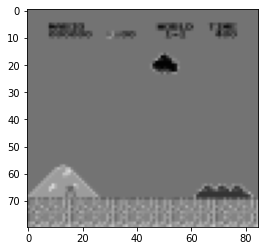

In [10]:
plt.imshow(state[0])

In [11]:
model = PPO('CnnPolicy', env, verbose=0, tensorboard_log=LOG_DIR, learning_rate=LEARNING_RATE, n_steps=N_STEPS,
            batch_size=BATCH_SIZE, n_epochs=N_EPOCHS, gamma=GAMMA)

In [12]:
%%time
model.learn(total_timesteps=TOTAL_TIMESTEP_NUMB)

/opt/conda/lib/python3.7/site-packages/gym_super_mario_bros/smb_env.py:148: RuntimeWarning: overflow encountered in ubyte_scalars
  return (self.ram[0x86] - self.ram[0x071c]) % 256


CPU times: user 4h 44min 27s, sys: 2min 28s, total: 4h 46min 56s
Wall time: 4h 48min 13s


In [13]:
model.save(path='./train/2000000')

/opt/conda/lib/python3.7/site-packages/stable_baselines3/common/save_util.py:276: UserWarning: Path 'train' does not exist. Will create it.
  warnings.warn(f"Path '{path.parent}' does not exist. Will create it.")


In [14]:
forvideo = PPO.load('./train/2000000')

In [15]:
total_reward = [0] * EPISODE_NUMBERS
total_time = [0] * EPISODE_NUMBERS
best_reward = 0
frames_best = []

for i in range(EPISODE_NUMBERS):
    state = env.reset()  # reset for each new trial
    done = False
    total_reward[i] = 0
    total_time[i] = 0
    frames = []
    while not done and total_time[i] < 10000:
        action, _ = forvideo.predict(state)
        state, reward, done, info = env.step(action)
        total_reward[i] += reward[0]
        total_time[i] += 1
        frames.append(copy.deepcopy(env.render(mode='rgb_array')))

    if total_reward[i] > best_reward:
        best_reward = total_reward[i]
        frames_best = copy.deepcopy(frames)

    print('test episode:', i, 'reward:', total_reward[i], 'time:', total_time[i])

print('average reward:', (sum(total_reward) / EPISODE_NUMBERS),
      'average time:', (sum(total_time) / EPISODE_NUMBERS),
      'best_reward:', best_reward)

test episode: 0 reward: 864.0 time: 407
test episode: 1 reward: 861.0 time: 328
test episode: 2 reward: 122.0 time: 56
test episode: 3 reward: 977.0 time: 434
test episode: 4 reward: 1564.0 time: 612
test episode: 5 reward: 329.0 time: 142
test episode: 6 reward: 1573.0 time: 641
test episode: 7 reward: 937.0 time: 385
test episode: 8 reward: 532.0 time: 338
test episode: 9 reward: 414.0 time: 245
average reward: 817.3 average time: 358.8 best_reward: 1573.0


In [16]:
frames_new = np.array(frames_best)
matplotlib.rcParams['animation.embed_limit'] = 2**128
plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(frames_new[0])
plt.axis('off')
animate = lambda i: patch.set_data(frames_new[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames_new), interval = 50)
display(HTML(ani.to_jshtml()))
plt.close()